In [2]:
import numpy as np
import tensorflow as tf
import time

2023-02-06 11:26:55.046753: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-06 11:26:56.123635: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-06 11:26:56.123822: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-06 11:26:56.123843: W tensorfl

In [80]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

import tensorflow as tf
import tensorflow_ranking as tfr
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, LSTM, Permute, Conv1D, MaxPooling1D, Conv2D, MaxPooling2D, Reshape, Dropout

from keras.regularizers import l2, l1


from sklearn.decomposition import PCA
from sklearn.utils import class_weight
from sklearn.metrics import f1_score
import sklearn

import pickle

from featurize import featurize

from scaler import CustomScaler



device_name = tf.test.gpu_device_name()


class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
    
    
class VAE(keras.Model):
    def __init__(self, encoder, decoder, _classifier = None, _auth = None, beta = 0.001, alpha = 0.1, scale_included=True, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

        self.classifier = _classifier
        self.auth = _auth
        #self.classifier = keras.models.load_model(f'data/models/{model_name}.hdf5')
        
        self.auth_on = True
        self.scale_included = scale_included
        self.scaler = None

        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.feature_loss_tracker = keras.metrics.Mean(
            name="feature_loss"
        )
        self.classification_loss_tracker = keras.metrics.Mean(
            name="classification_loss"
        )
        self.reencoding_loss_tracker = keras.metrics.Mean(
            name="reencoding_loss"
        )
        self.auth_loss_tracker = keras.metrics.Mean(name="auth_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        
        self.beta = beta
        self.alpha= alpha

    def save_model(self, folder, tag):
        
        with open(f'data/models/{folder}/enc_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.encoder, f)

        with open(f'data/models/{folder}/dec_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.decoder, f)

        with open(f'data/models/{folder}/auth_{tag}.pickle', 'wb') as f:
            # Pickle the 'data' dictionary using the highest protocol available.
            pickle.dump(self.auth, f)
            
        if self.scale_included:
            with open(f'data/models/{folder}/scaler_{tag}.pickle', 'wb') as f:
                # Pickle the 'data' dictionary using the highest protocol available.
                pickle.dump(self.scaler, f)
    
    def load_model(self, folder, tag):
        
        with tf.keras.utils.custom_object_scope({'Sampling': Sampling}):
            with open(f'data/models/{folder}/enc_{tag}.pickle', 'rb') as pickle_file:
                self.encoder = pickle.load(pickle_file)
            with open(f'data/models/{folder}/dec_{tag}.pickle', 'rb') as pickle_file:
                self.decoder = pickle.load(pickle_file)
            with open(f'data/models/{folder}/auth_{tag}.pickle', 'rb') as pickle_file:
                self.auth = pickle.load(pickle_file)
            if self.scale_included:
                with open(f'data/models/{folder}/scaler_{tag}.pickle', 'rb') as pickle_file:
                    # Pickle the 'data' dictionary using the highest protocol available.
                    self.scaler = pickle.load(pickle_file)
    
    def fit_scaler(self,data):
        self.scale_included = True
        self.scaler = CustomScaler()
        self.scaler.fit(data)
    
    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.feature_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        data, y_user_one_hot = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
        
            reconstruction = self.decoder(z)

            #data_probability = self.classifier(data)
            #reconstruction_probability = self.classifier(reconstruction)
            #classification_loss = tf.reduce_mean(abs(data_probability - reconstruction_probability))

            #reconstruction_loss = tf.reduce_mean(keras.losses.mse(data, reconstruction), axis=1) # * data_probability
            
            #re_encoded, _, _ = self.encoder(reconstruction)
            #reencoding_loss = tf.reduce_mean(keras.losses.mse(z_mean, re_encoded))
            
            #feature_loss = tf.reduce_mean(keras.losses.MeanAbsolutePercentageError(self.batch_features(data), self.batch_features(reconstruction)))
            
            #feature_loss = 0.5 * (tf.reduce_mean(keras.losses.mse(self.rolling_max(data), self.rolling_max(reconstruction))) + 
            #                              tf.reduce_mean(keras.losses.mse(self.rolling_min(data), self.rolling_min(reconstruction))) )
            
            #original_features = featurize(data)
            #new_features = featurize(reconstruction)
            
            # standardize here?
            
            #feature_loss = tf.reduce_mean(keras.losses.mse(original_features, new_features), axis=1)

            #reconstruction_loss = tf.reduce_mean(keras.losses.mean_absolute_error(data, reconstruction), axis=1)
            
            sample_loss = self.lb_keogh(data, reconstruction)
            
            reconstruction_loss= sample_loss
            
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            
            auth_output = self.auth(z)
            
            auth_loss = tfr.keras.losses.ApproxMRRLoss()(y_user_one_hot, auth_output)

            #sample_loss = 0.5 * reconstruction_loss + 0.5 * feature_loss #+ 0.0 * feature_loss
            
            if self.auth_on:
                total_loss = self.alpha * auth_loss + sample_loss + self.beta * kl_loss #+ classification_loss # + 0.1*feature_loss
            else:
                total_loss = sample_loss + self.beta * kl_loss

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.auth_loss_tracker.update_state(auth_loss)
        #self.feature_loss_tracker.update_state(feature_loss)
        #self.reencoding_loss_tracker.update_state(reencoding_loss)
        #self.classification_loss_tracker.update_state(classification_loss) #
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "classification_loss": self.classification_loss_tracker.result(),
            "feature_loss"       : self.feature_loss_tracker.result(),
            "auth_loss": self.auth_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }


    def batch_features(self, x):
        feature_list = []
        #_max = tf.math.reduce_max(x, axis=1)
        #_min = tf.math.reduce_min(x, axis=1)
        _segment_max = self.rolling_max(x)
        _segment_min = self.rolling_min(x)
        _range = _segment_max - _segment_min
        
        _mean = tf.math.reduce_mean(_range, axis=0)
        _std = tf.math.reduce_std(_range, axis=0)
        
        return [ _mean, _std] # _max, _min,

    def lb_keogh(self, ts1, ts2):

        u = vae.rolling_max(ts1, w=10)
        l = vae.rolling_min(ts1, w=10)

        above = ts2 > u
        below = ts2 < l

        above_sum = tf.reduce_sum((ts2[above]-u[above])**2) / 200 / 16
        below_sum = tf.reduce_sum((ts2[below]-u[below])**2) / 200 / 16

        lb_keogh_sum = above_sum + below_sum
        lb_keogh_sum = lb_keogh_sum / 128
        return lb_keogh_sum
        
        

    def rolling_max(self, x, w=5):
        return tf.nn.pool(
            x,
            (w,),
            "MAX",
            strides=(1,),
            padding='SAME'
        )
    
    def rolling_min(self, x, w=5):
        return -tf.nn.pool(
            -x,
            (w,),
            "MAX",
            strides=(1,),
            padding='SAME'
        )
        
    def rolling_mean(self, x):
        return tf.nn.pool(
            x,
            (5,),
            "MEAN",
            strides=(5,),
            padding='VALID'
        )
    

"""  
def get_auth_model(input_dim):
    inputs = keras.Input(shape=input_dim)
    x = inputs
    x = Reshape((200, 16, 1))(x)
    x = Conv2D(10,(3, 1), kernel_regularizer=l2(0.01), strides=(1,1), padding="same")(x)
    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)

    x = Conv2D(100,(2,16),strides=(1,1), kernel_regularizer=l1(0.01))(x)

    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)
    x = Permute((1,3,2))(x)
    x = Reshape((50,100))(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)
    x = MaxPooling1D(pool_size=2, strides=None, padding="same")(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)

    x = LSTM(50)(x)

    x = Dense(25, activation="relu")(x)
    x = Dropout(0.2)(x)
    x = Dense(10, activation="relu")(x)
    x = Dropout(0.2)(x)
    x = Dense(1, activation="sigmoid")(x)
    out = x

    model = keras.Model(inputs, out, name="LSTM_classifier")
    return model
"""

def get_auth_model(input_dim):
    inputs = keras.Input(shape=input_dim)
    x = inputs
    x = Reshape((200, 16, 1))(x)
    x = Conv2D(10,(3, 1), kernel_regularizer=l2(0.01), strides=(1,1), padding="same")(x)
    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)

    x = Conv2D(100,(2,16),strides=(1,1), kernel_regularizer=l1(0.01))(x)

    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)
    x = Permute((1,3,2))(x)
    x = Reshape((50,100))(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)
    x = MaxPooling1D(pool_size=2, strides=None, padding="same")(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)

    x = LSTM(50)(x)

    x = Dense(25, activation="relu")(x)
    x = Dropout(0.2)(x)
    x = Dense(10, activation="relu")(x)
    x = Dropout(0.2)(x)
    x = Dense(1, activation="sigmoid")(x)
    out = x

    model = keras.Model(inputs, out, name="LSTM_classifier")
    return model

def get_encoder(input_dim, latent_dim=200):

    inputs = keras.Input(shape=input_dim)

    x = inputs
    x = Reshape((200, 16, 1))(x)
    x = Conv2D(10, (3, 1), kernel_regularizer=l2(0.01), strides=(1,1), padding="same")(x)
    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)

    x = Conv2D(100,(2,16), kernel_regularizer=l1(0.01), strides=(1,1))(x)

    x = MaxPooling2D(pool_size=(2,1), strides=None, padding="same")(x)
    x = Permute((1,3,2))(x)
    x = Reshape((50,100))(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)
    x = MaxPooling1D(pool_size=2, strides=None, padding="same")(x)

    x = layers.SpatialDropout1D(0.2)(x)
    x = Conv1D(50, 4, strides=2, padding="same")(x)

    x = LSTM(latent_dim)(x)

    z_mean = layers.Dense(latent_dim, name="z_mean" )(x) # kernel_initializer=keras.initializers.Zeros()
    z_log_var = layers.Dense(latent_dim, name="z_log_var", kernel_initializer=keras.initializers.Zeros())(x)

    ## TODO add in dropout here

    z = Sampling()([z_mean, z_log_var])

    encoder = keras.Model(inputs, [z_mean, z_log_var, z], name="encoder")
    return encoder


def get_decoder(latent_dim):
    
    # assumes size of the output

    latent_inputs = keras.Input(shape=(latent_dim,))
    x = latent_inputs
    #x = layers.Dropout(rate=0.2)(x)
    #x = layers.Reshape((latent_dim))(x)
    x = layers.RepeatVector(25)(x)
    #x = layers.Permute((2,1))(x)
    x = layers.LSTM(100, activation="relu", input_shape=(25,latent_dim), return_sequences=True)(x)

    x = layers.TimeDistributed(layers.Dense(100, activation="relu"))(x)
    x = layers.TimeDistributed(layers.Dense(16))(x)

    x = layers.Conv1D(16,4, padding="same")(x)
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(16,4, padding="same")(x)
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(16,8, padding="same")(x)
    x = layers.UpSampling1D(size=2)(x)
    x = layers.Conv1D(16,8, padding="same")(x)

    x2 = layers.RepeatVector(25)(latent_inputs)

    decoder_outputs = x

    decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
    return decoder

def get_auth_model_from_latent_space(latent_dim):
    latent_inputs = keras.Input(shape=(latent_dim,))
    x = latent_inputs
    x = layers.Dense(25, activation="relu")(x)
    x = layers.Dense(16, activation="softmax")(x)

    auth_outputs = x

    auth = keras.Model(latent_inputs, auth_outputs, name="auth")
    return auth
    
    




Epoch 1/1000
19/19 [==============================] - 12s 77ms/step - loss: 0.6872 - reconstruction_loss: 0.6606 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.1239 - kl_loss: 1.3325
Epoch 2/1000
19/19 [==============================] - 2s 83ms/step - loss: 0.5938 - reconstruction_loss: 0.5868 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.1249 - kl_loss: 4.8671
Epoch 3/1000
19/19 [==============================] - 1s 78ms/step - loss: 0.5456 - reconstruction_loss: 0.5421 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.1296 - kl_loss: 6.9336
Epoch 4/1000
19/19 [==============================] - 2s 86ms/step - loss: 0.5288 - reconstruction_loss: 0.5185 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.1398 - kl_loss: 7.4604
Epoch 5/1000
19/19 [==============================] - 1s 77ms/step - loss: 0.4889 - reconstruction_loss: 0.4972 - classification_loss: 0.0000e+00 - fea

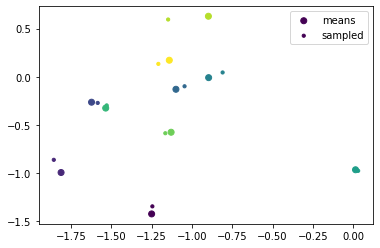

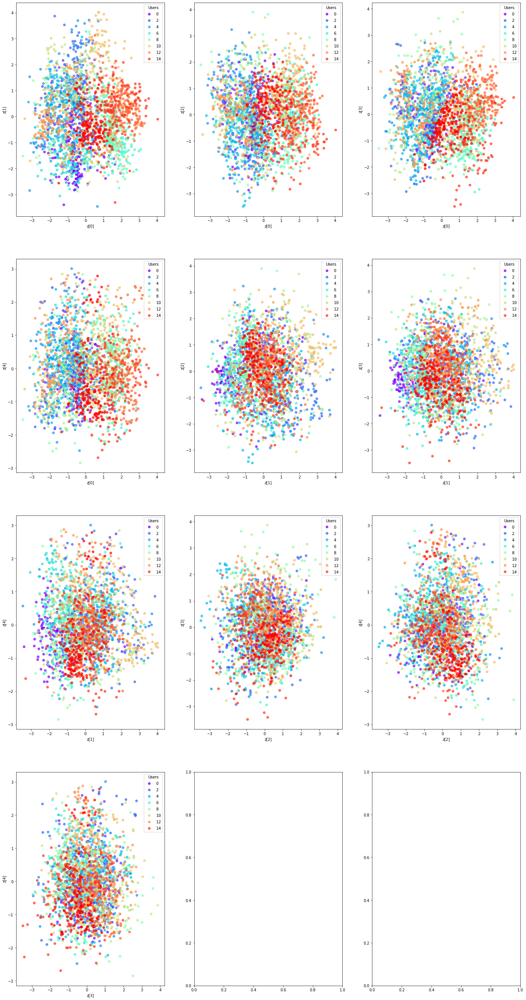

75/75 [==============================] - 0s 5ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


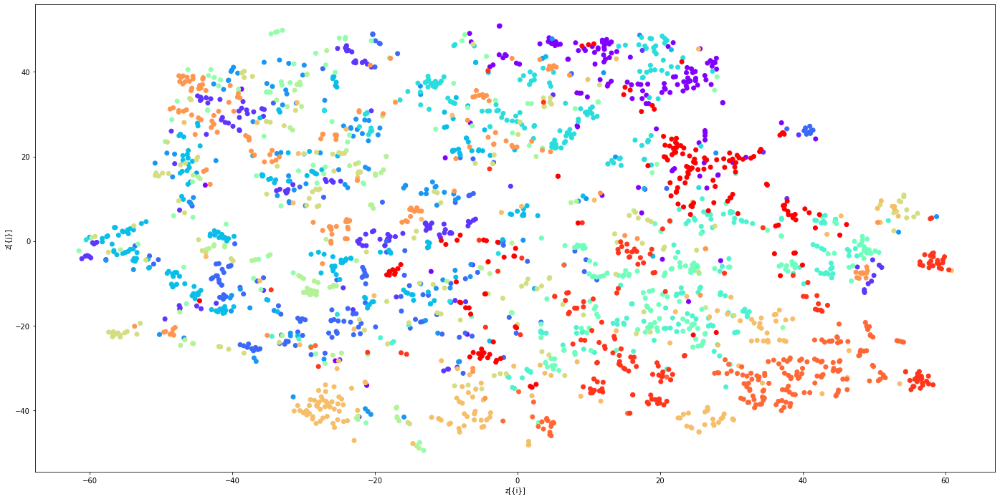

1/1 [==============================] - 0s 34ms/step


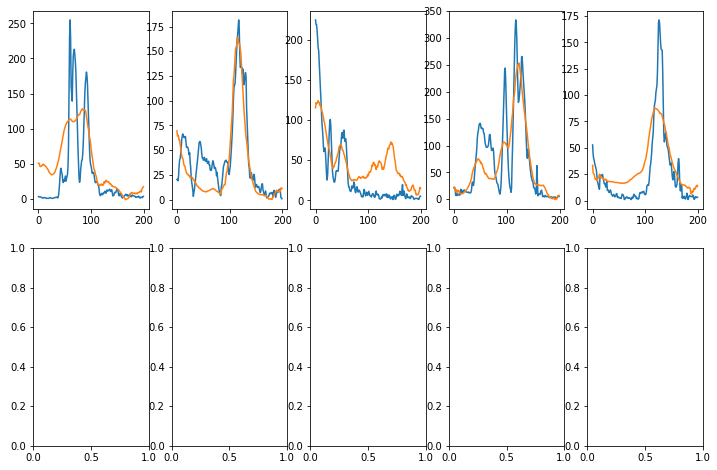

In [88]:
from visualise import *

vae = VAE(get_encoder((200,16), 10), get_decoder(10), None, get_auth_model_from_latent_space(10))

#vae.alpha = 0

device_name = tf.test.gpu_device_name()

file_name = "raw_with_maps" # or offsets_2

x_data = np.load(f"data/processed/x_{file_name}.npy")
y_user = np.load(f"data/processed/y_user_{file_name}.npy")
y_intent = np.load(f"data/processed/y_intent_{file_name}.npy").astype(int)
y_gesture = np.load(f"data/processed/y_gesture_type_{file_name}.npy")

train_gesture_map = np.load(f"data/processed/train_gesture_map_{file_name}.npy").astype(int)
test_gesture_map = np.load(f"data/processed/test_gesture_map_{file_name}.npy").astype(int)

###


_map = (train_gesture_map == 1) #& ((y_user.argmax(axis=1) >= 11))

user_x = x_data[_map]
user_y = y_user.argmax(axis=1)[_map]

vae.fit_scaler(x_data[y_intent == 0])

#user_x = vae.scaler.transform(user_x)

train_data = vae.scaler.transform(x_data[_map])

def show_visuals(vae):
    
    
    latent_space_means, latent_space_stds, latent_space = vae.encoder(vae.scaler.transform(x_data[:10]))

    plt.scatter(latent_space_means[:,0], latent_space_means[:,1], c = range(10), label="means")
    plt.scatter(latent_space[:,0], latent_space[:,1], label="sampled", c = range(10), s=10)

    plt.legend()
    
    plot_label_clusters(vae, vae.scaler.transform(user_x), user_y)
    visualise(vae, vae.scaler.transform(user_x), user_y, 10)
    plot_reconstructed_curves(vae, vae.scaler.transform(user_x), channel=7)

vae.compile(tf.keras.optimizers.Adam())
vae.fit(train_data, y_user[_map], batch_size=128, epochs=1000)

show_visuals(vae)

Epoch 1/1000
19/19 [==============================] - 12s 82ms/step - loss: 0.0549 - reconstruction_loss: 0.0899 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5624 - kl_loss: 22.3364
Epoch 2/1000
19/19 [==============================] - 1s 79ms/step - loss: 0.0383 - reconstruction_loss: 0.0754 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5624 - kl_loss: 22.2314
Epoch 3/1000
19/19 [==============================] - 2s 80ms/step - loss: 0.0320 - reconstruction_loss: 0.0710 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5625 - kl_loss: 22.1823
Epoch 4/1000
19/19 [==============================] - 2s 80ms/step - loss: 0.0298 - reconstruction_loss: 0.0691 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5625 - kl_loss: 22.1832
Epoch 5/1000
19/19 [==============================] - 1s 74ms/step - loss: 0.0287 - reconstruction_loss: 0.0690 - classification_loss: 0.0000e+00 -

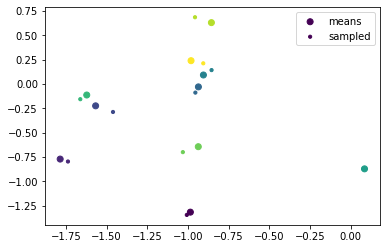

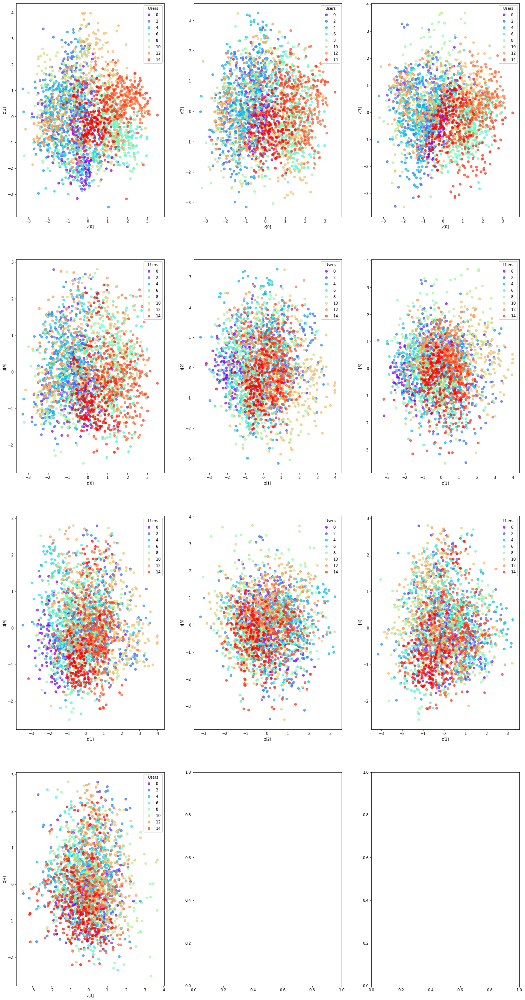

75/75 [==============================] - 0s 4ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


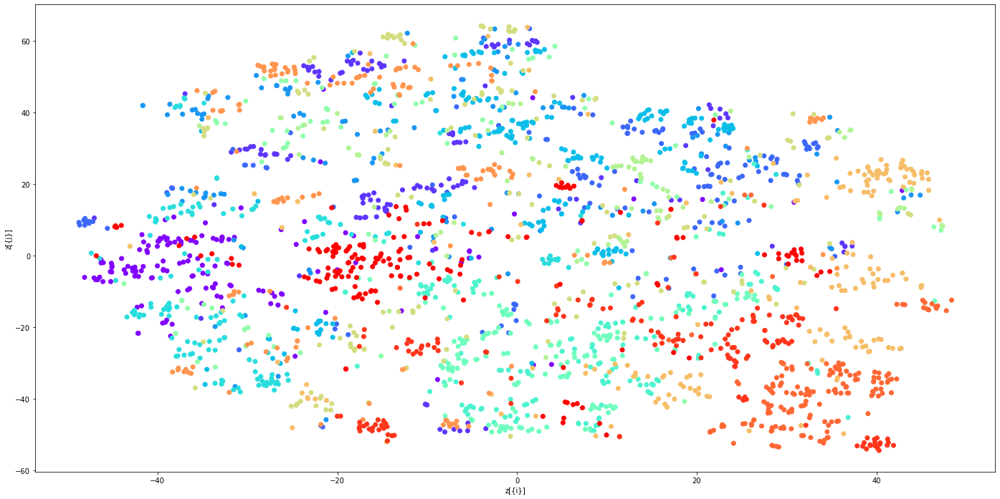

1/1 [==============================] - 0s 40ms/step


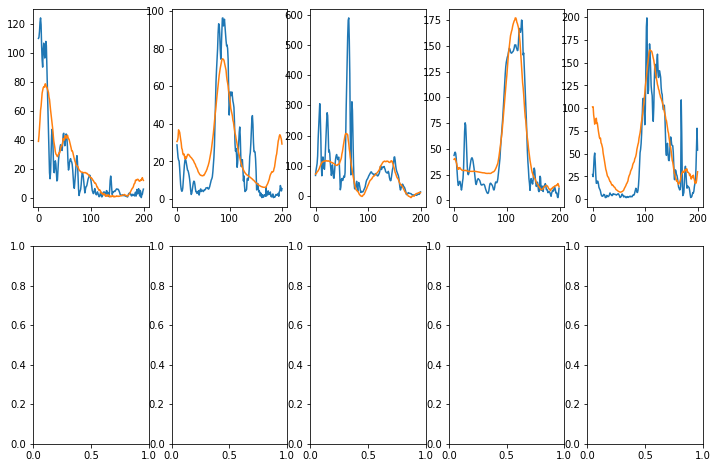

Epoch 1/1000
19/19 [==============================] - 12s 75ms/step - loss: 0.0325 - reconstruction_loss: 0.0703 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5980 - kl_loss: 22.2008
Epoch 2/1000
19/19 [==============================] - 2s 81ms/step - loss: 0.0181 - reconstruction_loss: 0.0586 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5980 - kl_loss: 22.2335
Epoch 3/1000
19/19 [==============================] - 1s 73ms/step - loss: 0.0121 - reconstruction_loss: 0.0545 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5980 - kl_loss: 22.1407
Epoch 4/1000
19/19 [==============================] - 1s 77ms/step - loss: 0.0116 - reconstruction_loss: 0.0531 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.5981 - kl_loss: 22.1092
Epoch 5/1000
19/19 [==============================] - 1s 76ms/step - loss: 0.0110 - reconstruction_loss: 0.0531 - classification_loss: 0.0000e+00 -

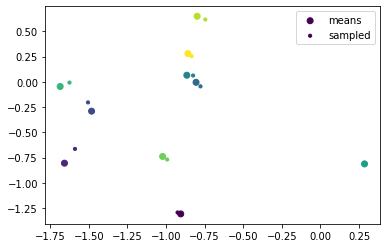

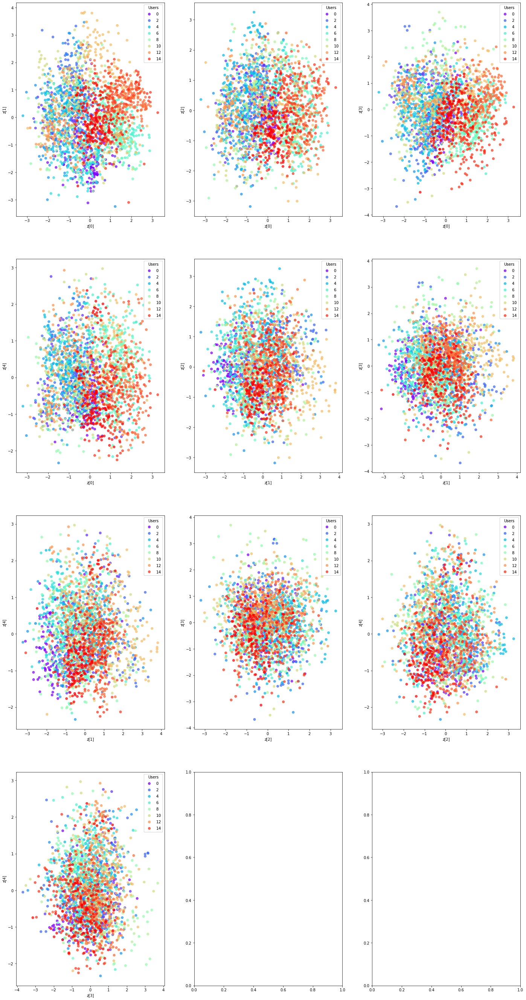

75/75 [==============================] - 0s 4ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


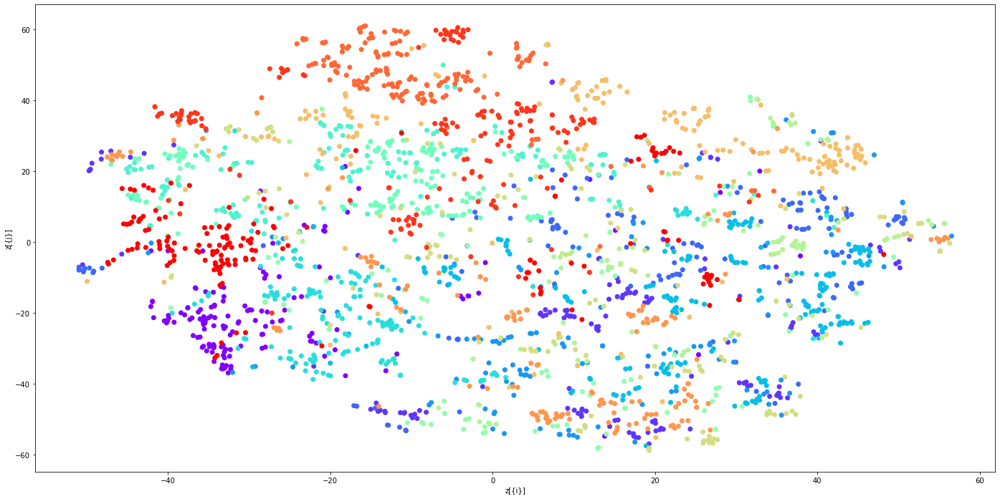

1/1 [==============================] - 0s 32ms/step


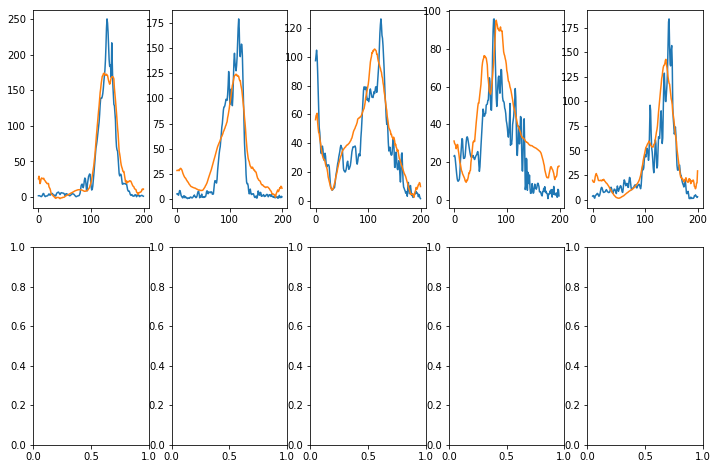

Epoch 1/1000
19/19 [==============================] - 12s 85ms/step - loss: 0.0221 - reconstruction_loss: 0.0599 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6143 - kl_loss: 22.1167
Epoch 2/1000
19/19 [==============================] - 1s 76ms/step - loss: 0.0103 - reconstruction_loss: 0.0510 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6143 - kl_loss: 22.1075
Epoch 3/1000
19/19 [==============================] - 1s 73ms/step - loss: 0.0061 - reconstruction_loss: 0.0482 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6143 - kl_loss: 21.9345
Epoch 4/1000
19/19 [==============================] - 1s 75ms/step - loss: 0.0053 - reconstruction_loss: 0.0478 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6143 - kl_loss: 21.8883
Epoch 5/1000
19/19 [==============================] - 1s 77ms/step - loss: 0.0061 - reconstruction_loss: 0.0486 - classification_loss: 0.0000e+00 -

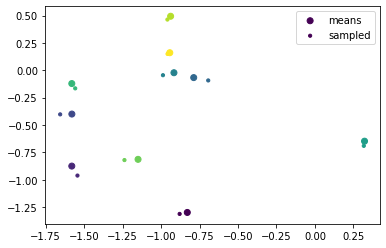

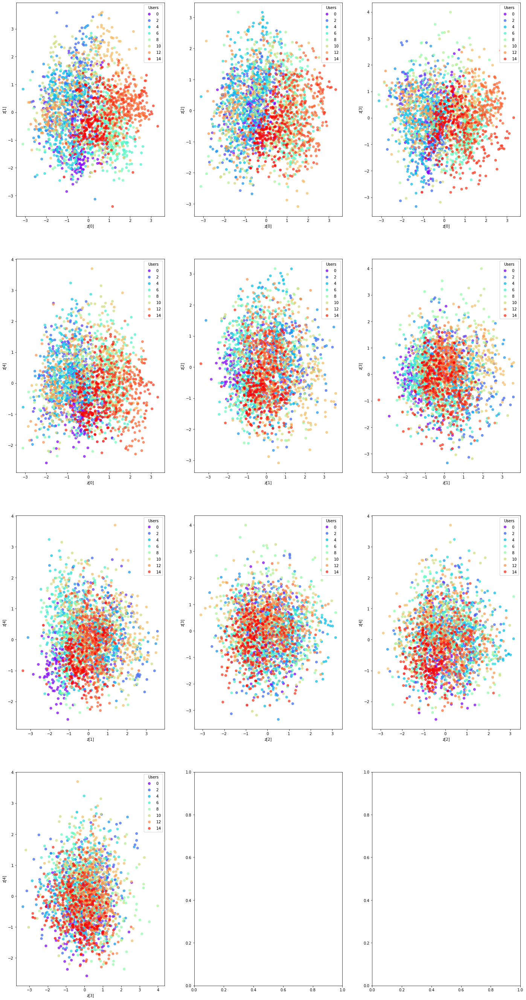

75/75 [==============================] - 0s 4ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


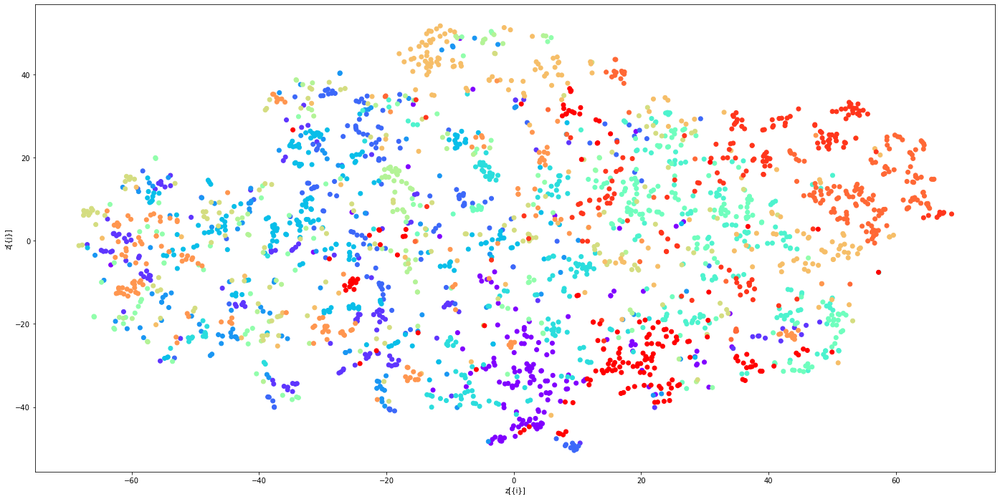

1/1 [==============================] - 0s 34ms/step


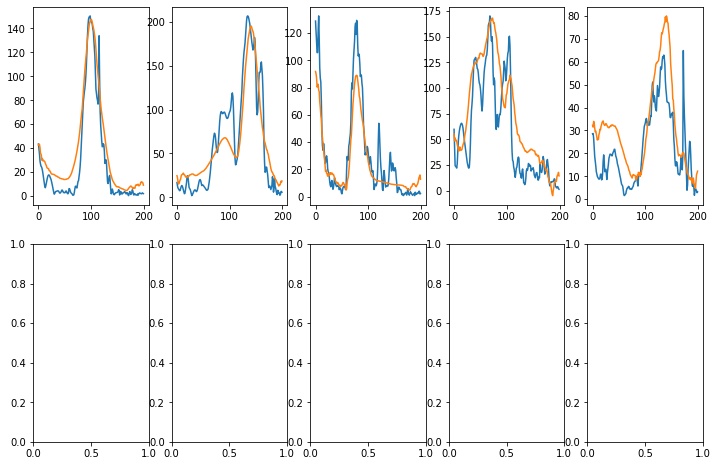

Epoch 1/1000
19/19 [==============================] - 14s 84ms/step - loss: 0.0256 - reconstruction_loss: 0.0627 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6230 - kl_loss: 21.9078
Epoch 2/1000
19/19 [==============================] - 2s 86ms/step - loss: 0.0063 - reconstruction_loss: 0.0491 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6230 - kl_loss: 21.9067
Epoch 3/1000
19/19 [==============================] - 2s 80ms/step - loss: 0.0010 - reconstruction_loss: 0.0450 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6230 - kl_loss: 21.8288
Epoch 4/1000
19/19 [==============================] - 2s 84ms/step - loss: 0.0019 - reconstruction_loss: 0.0434 - classification_loss: 0.0000e+00 - feature_loss: 0.0000e+00 - auth_loss: -0.6230 - kl_loss: 21.8186
Epoch 5/1000
19/19 [==============================] - 2s 83ms/step - loss: 8.1824e-04 - reconstruction_loss: 0.0433 - classification_loss: 0.0000e+

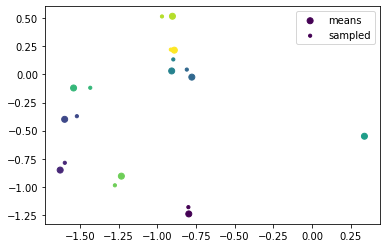

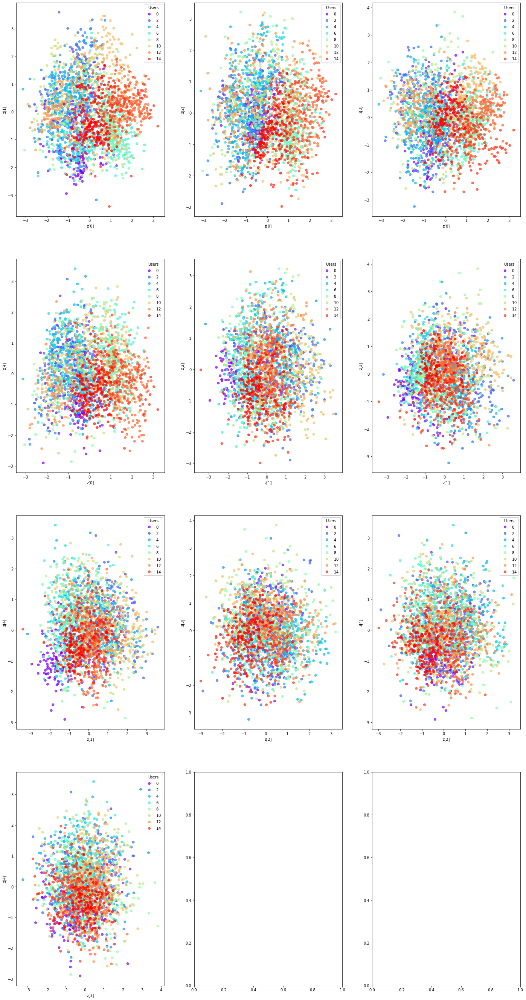

75/75 [==============================] - 0s 4ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


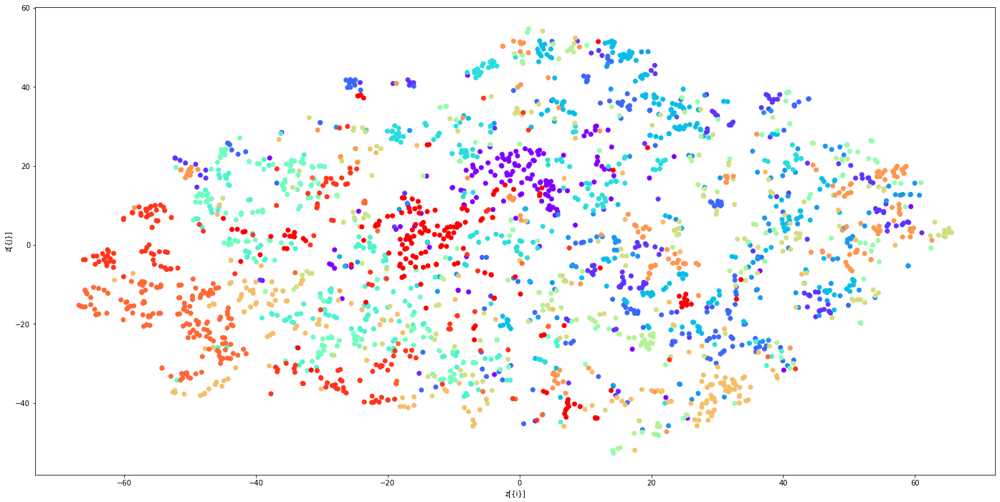

1/1 [==============================] - 0s 31ms/step


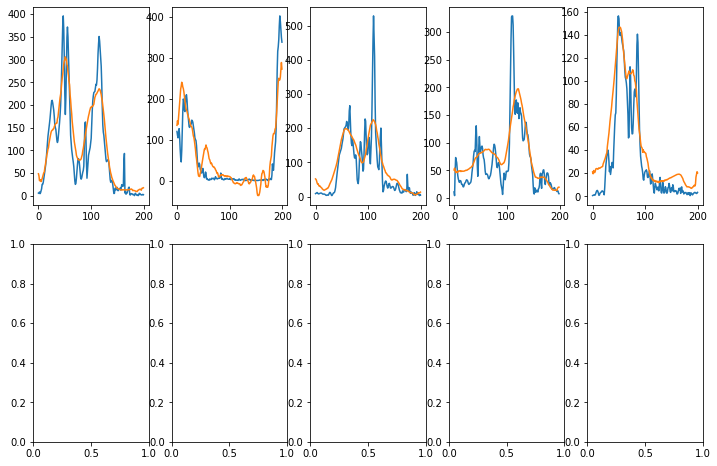

In [89]:
for i in range(4):

    vae.compile(tf.keras.optimizers.Adam())
    vae.fit(train_data, y_user[_map], batch_size=128, epochs=1000)

    show_visuals(vae)

34/34 [==============================] - 0s 4ms/step


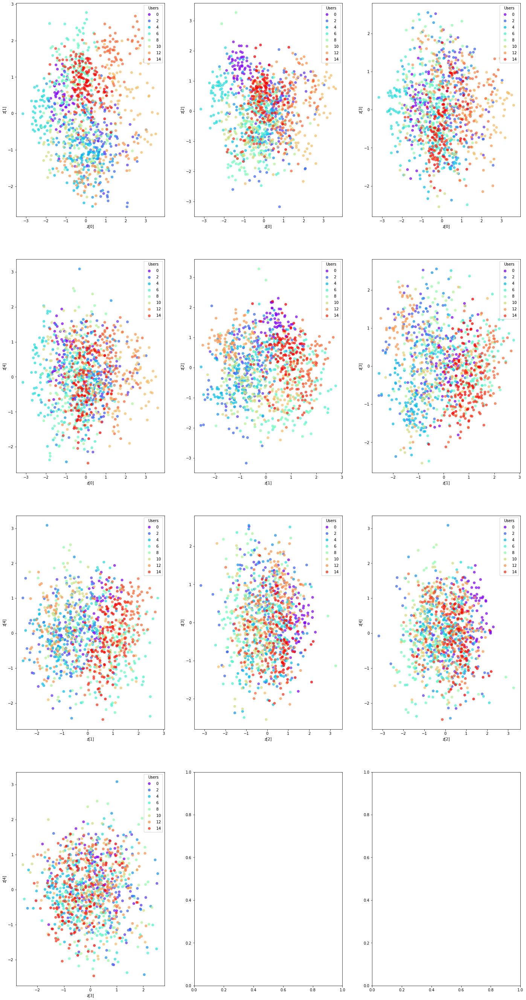

34/34 [==============================] - 0s 4ms/step


/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


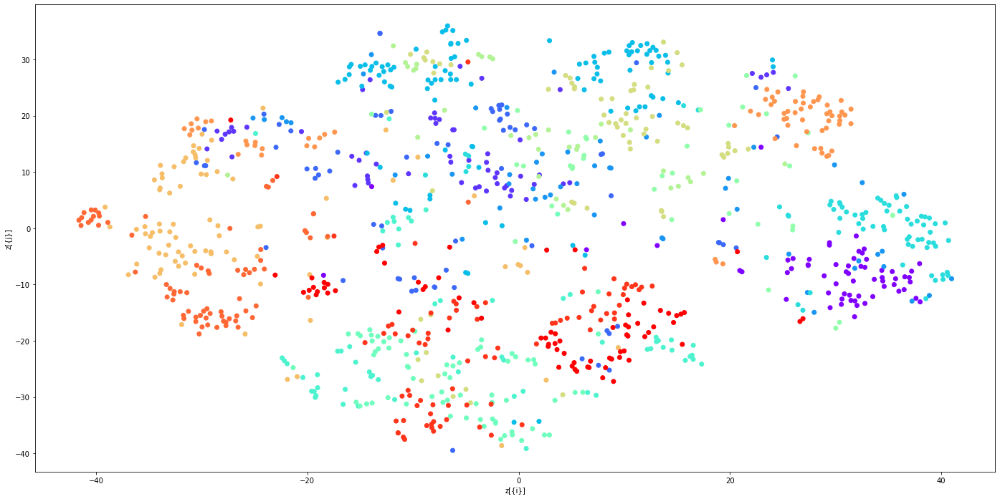

1/1 [==============================] - 0s 43ms/step


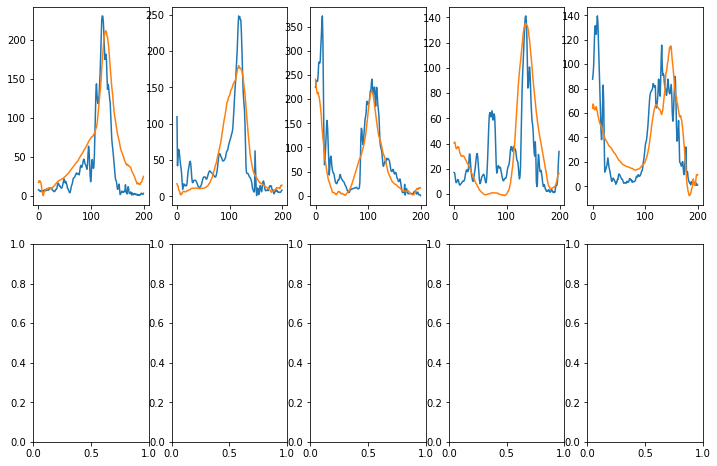

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_52 (InputLayer)          [(None, 200, 16)]    0           []                               
                                                                                                  
 reshape_34 (Reshape)           (None, 200, 16, 1)   0           ['input_52[0][0]']               
                                                                                                  
 conv2d_34 (Conv2D)             (None, 200, 16, 10)  40          ['reshape_34[0][0]']             
                                                                                                  
 max_pooling2d_34 (MaxPooling2D  (None, 100, 16, 10)  0          ['conv2d_34[0][0]']              
 )                                                                                          

In [95]:
   
plot_label_clusters(vae, vae.scaler.transform(x_data[test_gesture_map==1]), y_user.argmax(axis=1)[test_gesture_map==1])
visualise(vae, vae.scaler.transform(x_data[test_gesture_map==1]), y_user.argmax(axis=1)[test_gesture_map==1], 10)
plot_reconstructed_curves(vae, vae.scaler.transform(x_data[test_gesture_map==1]), channel=7)



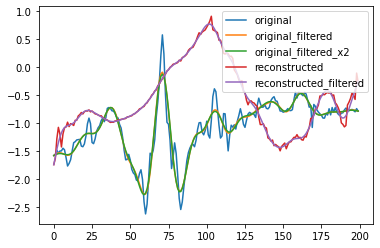

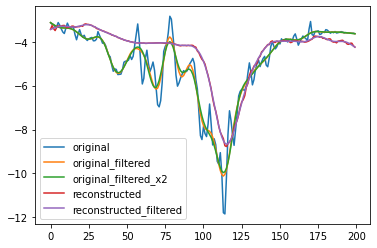

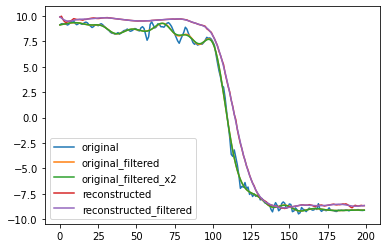

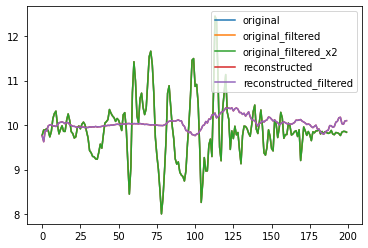

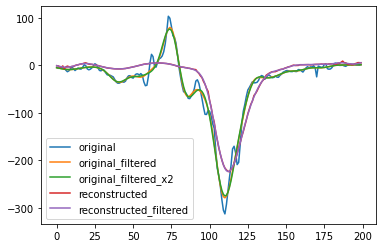

...

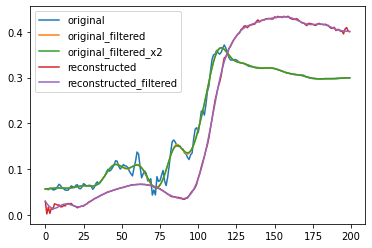

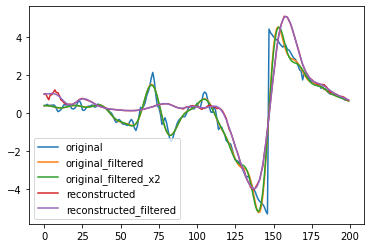

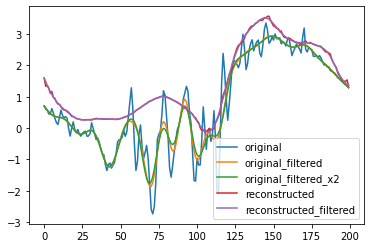

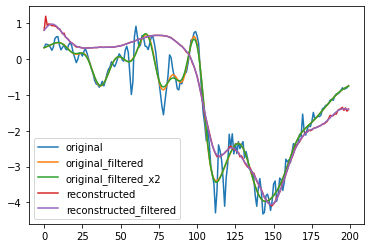

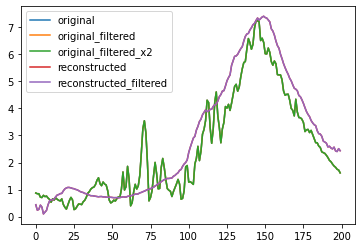

In [124]:
from featurize import filter as do_filter, butter_lowpass_filter

def _filter(data, filter_indices, order, cutoff):
    
    n = data.shape[1]
    
    timespan = 4
    times = np.linspace(-4, 0, num=n)
    
    t = np.linspace(times[0], times[len(times) - 1], n, endpoint = False) #evenly spaced time intervals
    r = int(n / (times[len(times) - 1] - times[0])) #sample rate, Hz
    
    
    new_data = data.copy()
    
    for i in range(data.shape[0]):
        for j in filter_indices:
            filtered = butter_lowpass_filter(data[i,:,j], cutoff, r, order)
            #plt.plot(data[i,:,j])
            #plt.plot(filtered)
            #plt.show()
            new_data[i,:,j] = filtered

    return new_data

x_data = np.load(f"data/processed/x_{file_name}.npy")

ORDER = 6
CUTOFF = 3.667
FILTER_INDICES = [0,1,2, 4,5,6, 8,9,10, 11, 12,13,14]

filtered_x = _filter(x_data[:20], FILTER_INDICES, ORDER, CUTOFF)
twice_filtered_x = _filter(filtered_x, FILTER_INDICES, ORDER, CUTOFF)

enc = vae.encoder(vae.scaler.transform(x_data[:20]))[0]
predicted = vae.scaler.inverse_transform(vae.decoder(enc).numpy())
predicted_filtered = _filter(predicted, FILTER_INDICES, ORDER, CUTOFF)

num = 3

for chan in range(16):
    plt.plot(x_data[num,:,chan], label="original")
    plt.plot(filtered_x[num,:,chan], label="original_filtered")
    plt.plot(twice_filtered_x[num,:,chan], label="original_filtered_x2")
    plt.plot(predicted[num,:,chan], label = "reconstructed")
    plt.plot(predicted_filtered[num,:,chan], label = "reconstructed_filtered")
    plt.legend()
    plt.show()

<tf.Tensor: shape=(2656,), dtype=float64, numpy=
array([1.87987956, 0.95525407, 0.42569622, ..., 0.06975937, 0.23313543,
       1.81945837])>

tf.Tensor(15.584571965570404, shape=(), dtype=float64)
tf.Tensor(15.584571965570404, shape=(), dtype=float64)


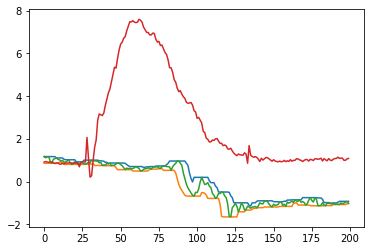

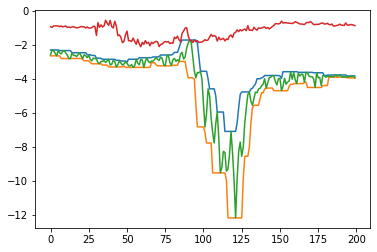

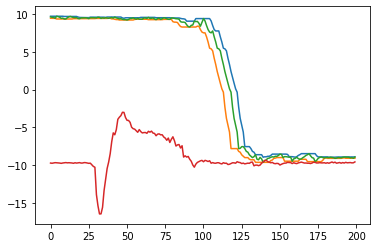

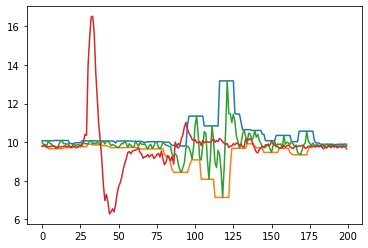

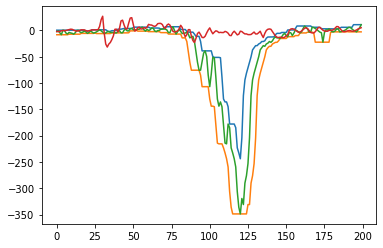

...

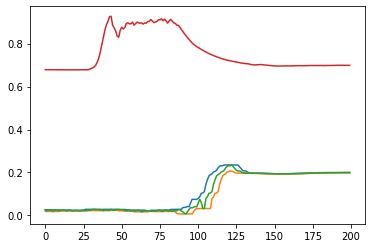

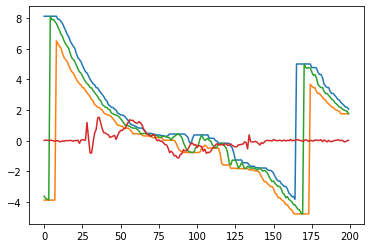

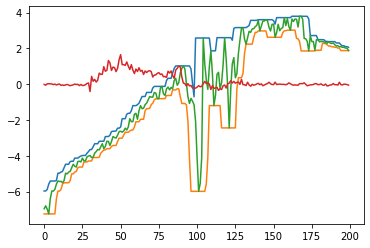

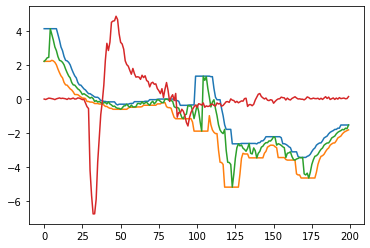

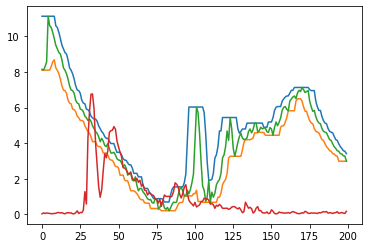

In [79]:
ts1 = filter(x_data[0:2,:]
ts2 = x_data[410:412,:]
u = vae.rolling_max(ts1, w=10)
l = vae.rolling_min(ts1, w=10)

above = ts2 > u
below = ts2 < l

display((ts2[above]-u[above])**2)

above_sum = tf.reduce_sum((ts2[above]-u[above])**2) / 200 / 16
below_sum = tf.reduce_sum((ts2[below]-u[below])**2) / 200 / 16

lb_keogh_sum = (above_sum + below_sum)
print(lb_keogh_sum  /128)

print(vae.lb_keogh(ts1, ts2))

for chan in range(16):
    plt.plot(u[0,:,chan])
    plt.plot(l[0,:,chan])
    plt.plot(ts1[0,:,chan])
    plt.plot(ts2[0,:,chan])
    plt.show()
#plt.plot(x_data[410,:,chan])

In [2]:
def DTWDistance(s1, s2, w = 5):
    DTW={}
    
    DTW[(-1, -1)] = 0.0
    
    for i in range(len(s1)):
        for j in range(max(0, i-w), min(len(s1)-1, i+w)):
            DTW[i, j] = 0.0
    print(s1.shape)

    #SoftDTWTF._softmin3_tf
    
    for i in range(len(s1)):
        for j in range(max(1, i-w), min(len(s1), i+w)):
            dist= tf.reduce_mean(tf.keras.losses.mse(s1[i,:], s2[j,:]))
            DTW[(i, j)] = dist + min(DTW.get((i-1, j), float('inf')) , DTW.get((i, j-1), float('inf')),  DTW.get((i-1, j-1), float('inf')) )
    return np.sqrt(DTW[len(s1)-1, len(s2)-1])


In [ ]:
s = time.time()
print(DTWDistance(x_data[0, :-10, :], x_data[0, 10:, :], w=20))
t = time.time()
t-s

from matplotlib import pyplot as plt

plt.plot(x_data[0, :-10, 0])
plt.plot(x_data[0, 10:, 0])

In [16]:
# adapted from https://github.com/GitMarco27/TMML/blob/d5a05e79fa74358caec545555e3558ede5c1715a/Notebooks/011_Dtw_Loss_Function.ipynb

class DtwLoss(tf.keras.losses.Loss):
    def __init__(self, batch_size = 32):
        super(DtwLoss, self).__init__()
        self.batch_size = batch_size

    def call(self, y_true, y_pred):
        length = 200
        tmp = []
        for item in range(self.batch_size):
            print(item)
            s = y_true[item, :]
            t = y_pred[item, :]
            dtw_matrix = np.zeros((length+1,length+1))
            dtw_matrix[:] = np.inf
            dtw_matrix[0][0] = 0

            for i in range(1, length + 1):
                for j in range(1, length + 1):
                    cost = tf.reduce_mean(tf.keras.losses.mse(s[i - 1], t[j - 1]))
                    last_min = tf.reduce_min([dtw_matrix[i - 1][j], dtw_matrix[i][j - 1], dtw_matrix[i - 1][j - 1]])
                    dtw_matrix[i][j] = tf.cast(cost, dtype=tf.float32) + tf.cast(last_min, dtype=tf.float32)
            
            
            tmp.append(tf.stack(dtw_matrix[length, length]))
        return tf.reduce_mean(tmp)

In [3]:
x_data = np.load(f"data/processed/x_raw_with_maps.npy")

loss = DtwLoss(batch_size=1)
loss(x_data[:10], x_data[10:20])

NameError: name 'DtwLoss' is not defined

In [63]:
mat = np.zeros((200,16))
mat[:] = np.inf

In [64]:
mat

array([[inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       ...,
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf],
       [inf, inf, inf, ..., inf, inf, inf]])

In [7]:
#https://github.com/PeteWe/ts_similarity_tensorflow/blob/master/SoftDTWTF.py

import sys

DBL_MAX = sys.float_info.max

class SoftDTWTF():

    @staticmethod 
    def _squared_euclidean_tf(X, Y, squared=True):
        """
        Computes pairwise distances between each element of X and each
        element of Y.
        Args:
        X,    [s,m,d] matrix
        Y,    [p,n,d] matrix
        Returns:
        D,    [s,p,m,n] matrix of pairwise distances
        """
        # squared norms of each row in X and Y. sum over feature axis.
        nx = tf.reduce_sum(tf.square(X), 2)
        ny = tf.reduce_sum(tf.square(Y), 2)
        # nx as column vector for every sample in X (-> expand_axis=2).
        nx = tf.expand_dims(tf.expand_dims(nx, axis=2), axis=1)
        # ny as row vector for every cluster in Y.
        ny = tf.expand_dims(tf.expand_dims(ny, axis=0), axis=2)

        # Dot product for each sample in X and each cluster in Y.
        XY_matmul = tf.einsum('mno,pho->mpnh',X,Y)
        
        # return matrix of pairwise euclidean differences.
        if squared:
            D = tf.maximum(nx - 2*XY_matmul + ny, 0.0)
        else:
            D = tf.sqrt(tf.maximum(nx - 2*XY_matmul + ny, 0.0))
        
        return tf.cast(D, dtype=tf.float64)
    
    @staticmethod
    def _squared_euclidean_tf_eff(X, squared=True):
        """
        Computes pairwise distances of element in diagonale of X. Calculations
        reduced to diagnoale to decrease computational cost. Required for
        normalization of SDTW.
        
        Args:
        X,    [s,m,d] matrix
        Returns:
        D,    [s,m] matrix of distances of elements on diagonale of X.
        """
        # squared norms of each row in X and Y. sum over feature axis.
        nx = tf.reduce_sum(tf.square(X), 2)
        # nx as column vector for every sample in X (-> expand_axis=2).
        nx_t = tf.expand_dims(nx,axis=2)
        # ny as row vector for every cluster in Y.
        ny = tf.expand_dims(nx, axis=1)

        # dot product for each sample in X and each cluster in Y.
        # M = p
        XX_matmul = tf.matmul(X,X, False,True)

        # return matrix of pairwise euclidean differences.
        if True:
            D = tf.maximum(nx_t - 2*XX_matmul + ny, 0.0)
        else:
            D = tf.sqrt(tf.maximum(nx_t - 2*XX_matmul + ny, 0.0))

        return tf.cast(D, dtype=tf.float64)
    
    @staticmethod    
    def _softmin3_tf(a, b, c, gamma=0.01):
        """
        Softmin as defined in by Cuturi et al. (2017) - Soft-DTW: a
        Differentiable Loss Function for Time-Series. a,b,c are elements in
        cost matrix R.
        
        Args:
        a,    R[:,:,i-1,j]
        b,    R[:,:,i-1,j-1]
        c,    R[:,:,i,j-1]
        Returns:
        softmin,,    Soft minimum of inputs.
        """
        a = tf.divide(a, -gamma)
        b = tf.divide(b, -gamma)
        c = tf.divide(c, -gamma)
        max_val = tf.maximum(tf.maximum(a,b),c)
        
        tmp = tf.add(tf.constant(0.0, dtype=tf.float64), tf.exp(a - max_val))
        tmp = tf.add(tmp, tf.exp(b - max_val))
        tmp = tf.add(tmp, tf.exp(c - max_val))
        
        return -gamma * (tf.math.log(tmp) + max_val)
    
    @staticmethod
    def _cond_dp_rec2(j,i,n,D,R):
        # Condiction for loop 2.
        return tf.less(j, n+1) 

    @staticmethod
    def _cond_dp_rec1(i,m,n,D,R):
        # Condition for loop 1.
        return tf.less(i, m+1)

    @staticmethod 
    def _dp_rec1(i, m, n, D, R):
        j = tf.constant(1)
        j, i, n, D, R = tf.while_loop(SoftDTWTF._cond_dp_rec2,
                                      SoftDTWTF._dp_rec2,
                                      [j, i, n, D, R])
        return tf.add(i,1), m, n, D, R

    @staticmethod 
    def _dp_rec2(j, i, n, D, R):   
        """
        Dynamic programming loop of dynamic time warping to calculate cost
        matrix R.
        
        Args:
        j,    loop variable of inner (this) loop.
        i,    loop variable of outer loop.
        n,    temporal dimension.
        D,    pairwise distance matrix D.
        R,    Prefilled cost matrix R with 0 and inf.
        Returns:
        j,    incremented loop variable.
        i,    outer loop variable.
        n,    temporal dimension.
        D,    pairwise distance matrix D.
        R,    Cost matrix R filled with new element.
        """
        # Extract all distance elements for current step.
        shape = R.shape
        a = R[:,:,i-1,j]
        b = R[:,:,i-1,j-1]
        c = R[:,:,i,j-1]
        d = D[:,:,i-1,j-1]
        # Get softmin of all elements and add it to current step.
        soft_min_ij = tf.add(d, SoftDTWTF._softmin3_tf(a, b, c))
        # Concat new element in R for calc of next step.
        R_bef = R[:,:,:i,:]
        R_row = tf.concat([R[:,:,i,:j],
                           tf.expand_dims(soft_min_ij,axis=2),
                           R[:,:,i,j+1:]], axis=2)
        R_aft = R[:,:,i+1:,:]        
        R = tf.concat([R_bef,tf.expand_dims(R_row,axis=2),R_aft], axis=2)
        # Set shape of R again.
        R.set_shape(shape)
        return tf.add(j,1), i, n, D, R
    
    @staticmethod
    def _soft_dtw_core(D):
        """
        Core sdtf function which calculates cost matrix R based on pairwise
        distance matrix D.
        
        Args:
        D,    pairwise distance matrix D.
        Returns:
        R,    Final cost matrix R..
        """
        s, c, m, n = D.get_shape().as_list() # m = n here.
        zeros = lambda: tf.zeros([m+2, n+2], dtype=tf.float64)
        
        # Generate single initial R matrix.
        A = tf.Variable(zeros, dtype=tf.float64)
        B = tf.Variable(zeros, dtype=tf.float64)
        A = A[1:m+1,0].assign(tf.ones_like(A[1:m+1,0])*DBL_MAX)
        B = B[0,1:n+1].assign(tf.ones_like(B[0,1:n+1])*DBL_MAX)
        R_single = A + B
        
        # Replicate initial R s-times.
        R = tf.ones([tf.shape(D)[0],tf.shape(D)[1], 1, 1],
                     dtype=tf.float64) * R_single
        
        i = tf.constant(1)
        loop1_vars = [i, tf.constant(m), tf.constant(n), D, R]
        i, m, n, D, R = tf.while_loop(SoftDTWTF._cond_dp_rec1,
                                      SoftDTWTF._dp_rec1,
                                      loop1_vars)      
        return R

    @staticmethod
    def _sdtw_tf_mat(x,y):
        """
        SDTW calc for all elements in x and y.
        
        Args:
        x,    [s,m,d] matrix of time series with s samples of length m, and
              dimension d.
        y,    [p,n,d] matrix of time series with s samples of length m, and
              dimension d.
        Returns:
        dists_norm,    normalized distances of all elements in x and y.
        """
        # Get D for xy, xx, yy.
        D = SoftDTWTF._squared_euclidean_tf(x,y)
        D_xx = SoftDTWTF._squared_euclidean_tf_eff(x)
        D_yy = SoftDTWTF._squared_euclidean_tf_eff(y)
        # Expand dimension 0 to make D_.._diagn of same dimension as D.
        D_xx_diag = tf.expand_dims(D_xx,axis=0)
        D_yy_diag = tf.expand_dims(D_yy,axis=0)
        # Set shapes od D to avoid errors in initialization of graph.
        D.set_shape((None,None,y.shape[1],y.shape[1]))
        D_xx_diag.set_shape((None,None,y.shape[1],y.shape[1]))
        D_yy_diag.set_shape((None,None,y.shape[1],y.shape[1]))
        # Calculate cost matric for all D.
        R = SoftDTWTF._soft_dtw_core(D)
        R_xx = SoftDTWTF._soft_dtw_core(D_xx_diag)
        R_yy = SoftDTWTF._soft_dtw_core(D_yy_diag)
        # Extract xx and yy for normalization.
        s, s, m, n = D.shape
        xx = R_xx[:,:, m, n]
        yy = R_yy[:,:, m, n]
        # Normalize R of xy.
        dists_norm = R[:,:, m, n] - 0.5 * (tf.reshape(xx, [-1,1]) + yy)
        
        return dists_norm
    
    
    @staticmethod 
    def sdtw_tf(x,y):
        """
        Entry point for tensorflow version of normalized soft-dtw for
        multivariate time series.
        
        Args:
        x,    [s,m,d] matrix of time series with s samples of length m, and
              dimension d.
        y,    [p,n,d] matrix of time series with s samples of length m, and
              dimension d.
        Returns:
        SoftDTWTF._sdtw_tf_mat(x,y),    normalized distances of all elements
                                        in x and y.
        """
        return SoftDTWTF._sdtw_tf_mat(x,y)

In [8]:
loss = SoftDTWTF()

In [15]:
import cProfile
import re


foo = lambda a : loss.sdtw_tf(x_data[:a,:10,:1], x_data[1:2,:10,:1])

cProfile.run('foo(1)')


         1483321 function calls (1443528 primitive calls) in 3.274 seconds

   Ordered by: standard name

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        1    0.000    0.000    3.274    3.274 1071246663.py:5(<lambda>)
       33    0.000    0.000    0.005    0.000 1110272521.py:100(_cond_dp_rec1)
       30    0.000    0.000    3.218    0.107 1110272521.py:105(_dp_rec1)
      300    0.017    0.000    3.129    0.010 1110272521.py:113(_dp_rec2)
        3    0.000    0.000    3.247    1.082 1110272521.py:151(_soft_dtw_core)
        6    0.000    0.000    0.002    0.000 1110272521.py:163(<lambda>)
        1    0.000    0.000    3.274    3.274 1110272521.py:183(_sdtw_tf_mat)
        1    0.000    0.000    3.274    3.274 1110272521.py:221(sdtw_tf)
        2    0.000    0.000    0.002    0.001 1110272521.py:39(_squared_euclidean_tf_eff)
      300    0.012    0.000    0.402    0.001 1110272521.py:70(_softmin3_tf)
        1    0.000    0.000    0.022    0.022 11102

In [103]:
import tensorflow as tf
import numpy as np

def batch_distance(X, Y, metric="L1"):
    """  batch模式的距离计算
    X: batch_size*seq_len1*feat_dim
    Y: batch_size*seq_len2*feat_dim
    这里只负责计算距离，不进行任何维度填充
    """

    assert metric == "L1", "wrong metric value !"

    N, T1, d = tf.shape(X)[0], tf.shape(X)[1], tf.shape(X)[2]
    T2 = tf.shape(Y)[1]

    X = tf.reshape(tf.tile(X, [1, 1, T2]), (N*T1*T2, d))
    Y = tf.reshape(tf.tile(Y, [1, T1, 1]), (N*T1*T2, d))

    res = tf.math.abs(X-Y)
    res = tf.reduce_sum(res, axis=-1)
    res = tf.cast(tf.reshape(res, [N, T1, T2]), tf.float32)

    raw_res = X-Y
    raw_res = tf.reduce_sum(raw_res, axis=-1)
    raw_res = tf.cast(tf.reshape(raw_res, [N, T1, T2]), tf.float32)

    return res, raw_res


def batch_soft_dtw(X, Y, gamma, warp, metric="L1"):
    """ batch模式的soft-DTW距离计算，并带有自定义的梯度（custom gradient） """

    N, T1 = tf.shape(X)[0], tf.shape(X)[1]
    T2 = tf.shape(Y)[1]

    #  获取欧式距离矩阵
    delta_matrix, raw_delta_matrix = batch_distance(X, Y, metric=metric)

    @tf.custom_gradient
    def _batch_soft_dtw_kernel(delta_matrix, raw_delta_matrix):

        delta_matrix_v1 = tf.identity(tf.cast(delta_matrix, tf.float32), "delta_matrix_v1")
        raw_delta_matrix_v1 = tf.identity(tf.cast(raw_delta_matrix, tf.float32), "raw_delta_matrix_v1")

        delta_array = tf.TensorArray(tf.float32, size=T1*T2, clear_after_read=False)
        delta_array = delta_array.unstack(tf.reshape(delta_matrix, [T1*T2, N]))

        r_array = tf.TensorArray(tf.float32, size=(T1+1)*(T2+1), clear_after_read=False)
        r_array = r_array.write(0, tf.zeros(shape=(N, )))

        def cond_boder_x(idx, array):
            return idx < T1+1

        def cond_boder_y(idx, seq_len):
            return idx < T2+1

        def body_border_x(idx, array):
            array = array.write(tf.cast(idx*(T2+1), tf.int32), 1000000*tf.ones(shape=(N, )))
            return idx+1, array

        def body_border_y(idx, array):
            array = array.write(tf.cast(idx, tf.int32), 1000000*tf.ones(shape=(N, )))
            return idx+1, array

        _, r_array = tf.while_loop(cond_boder_x, body_border_x, (1, r_array))
        _, r_array = tf.while_loop(cond_boder_y, body_border_y, (1, r_array))


        def cond(idx, array):
            return idx < (T1+1) * (T2+1)

        def body(idx, array):
            i = tf.cast(tf.divide(idx, T2+1), tf.int32)  # 行号
            j = tf.math.floormod(tf.cast(idx, tf.int32), T2+1)  # 列号

            def inner_func_v1():
                """ Parallel Tacotron2's version """
                z1 = -1./gamma * (array.read((i-1)*(T2+1)+(j-1)) +r_array.read((i-1)*(T2+1)+(j-1)))
                z2 = -1./gamma * (warp+array.read((i-1)*(T2+1)+(j))+r_array.read((i-1)*(T2+1)+(j)))
                z3 = -1./gamma * (warp+array.read((i)*(T2+1)+(j-1))+r_array.read((i)*(T2+1)+(j-1)))
                soft_min_value = -gamma * tf.math.reduce_logsumexp([z1, z2, z3], axis=0)
                r_value = tf.cast(soft_min_value, tf.float32)

                return array.write(idx, tf.cast(r_value, tf.float32))

            def outer_func():

                return array

            array = tf.cond(tf.less(i, 1) | tf.less(j, 1),
                true_fn=outer_func,
                false_fn=inner_func_v1)

            return idx+1, array

        _, r_array = tf.while_loop(cond, body, (0, r_array))
        r_matrix = r_array.stack()

        #  最终的soft-DTW距离
        r_matrix = tf.reshape(r_matrix, (N, T1+1, T2+1))
        r_matrix_v1 = tf.identity(tf.cast(r_matrix, tf.float32), "r_matrix_v1")

        def grad_v1(dy):
            """ Parallel Tacotron2's version, I solve it analytically """

            #  [N, T1+1, T2+1]
            delta_matrix = tf.concat([delta_matrix_v1, tf.zeros([N, T1, 1], tf.float32)], axis=2)
            delta_matrix = tf.concat([delta_matrix, tf.zeros([N, 1, T2+1], tf.float32)], axis=1)
            delta_array = tf.TensorArray(tf.float32, size=(T1+1)*(T2+1), clear_after_read=False)
            delta_array = delta_array.unstack(tf.reshape(delta_matrix, [(T1+1)*(T2+1), N]))
            delta_array = delta_array.write((T1+1)*(T2+1)-1, tf.zeros((N, )))

            #  [N, T1+2, T2+2]
            r_matrix = tf.concat([r_matrix_v1, -1000000*tf.ones([N, T1+1, 1], tf.float32)], axis=2)
            r_matrix = tf.concat([r_matrix, -1000000*tf.ones([N, 1, T2+2], tf.float32)], axis=1)
            r_array = tf.TensorArray(tf.float32, size=(T1+2)*(T2+2), clear_after_read=False)
            r_array = r_array.unstack(tf.reshape(r_matrix, [(T1+2)*(T2+2), N]))
            r_array = r_array.write((T1+2)*(T2+2)-1, r_array.read((T1+1)*(T2+2)-2))

            #  [N, T1+1, T2+1]
            e_matrix = tf.zeros([N, T1+1, T2+1], tf.float32)

            e_array = tf.TensorArray(tf.float32, size=(T1+1)*(T2+1), clear_after_read=False)
            e_array = e_array.unstack(tf.reshape(e_matrix, [(T1+1)*(T2+1), N]))
            e_array = e_array.write((T1+1)*(T2+1)-1, tf.ones((N, )))

            grad_array = tf.TensorArray(tf.float32, size=(T1+1)*(T2+1), clear_after_read=False)
            grad_array = grad_array.unstack(tf.reshape(e_matrix, [(T1+1)*(T2+1), N]))
            grad_array = grad_array.write((T1+1)*(T2+1)-1, tf.ones((N, )))

            def cond(idx, array, grad_array):
                return idx > 0

            def body(idx, array, grad_array):
                #  delta_array [N, T1+1, T2+1]
                #  r_array [N, T1+2, T2+2]
                #  e_array [N, T1+1, T2+1]

                j = tf.cast(tf.divide(idx, T1+1), tf.int32)  # 行号
                i = tf.math.floormod(tf.cast(idx, tf.int32), T1+1)  # 列号

                def inner_func():

                    a = tf.math.exp(1./gamma * (r_array.read((i+1)*(T2+2)+j)-r_array.read(i*(T2+2)+j)-delta_array.read(i*(T2+1)+(j-1))-warp))
                    b = tf.math.exp(1./gamma * (r_array.read((i)*(T2+2)+(j+1))-r_array.read(i*(T2+2)+j)-delta_array.read((i-1)*(T2+1)+j)-warp))
                    c = tf.math.exp(1./gamma * (r_array.read((i+1)*(T2+2)+(j+1))-r_array.read(i*(T2+2)+j)-delta_array.read((i)*(T2+1)+j)))
                    e_value = array.read(i*(T2+1)+(j-1))*a + array.read((i-1)*(T2+1)+j)*b + array.read(i*(T2+1)+j)*c

                    return array.write((i-1)*(T2+1)+(j-1), e_value), grad_array.write((i-1)*(T2+1)+j-1, array.read((i-1)*(T2+1)+j)+array.read(i*(T2+1)+(j-1))+array.read(i*(T2+1)+j))

                def outer_func():

                    return array, grad_array

                array, grad_array = tf.cond((i>0) & (j>0),
                    true_fn=inner_func,
                    false_fn=outer_func)

                return idx-1, array, grad_array

            _, e_array, grad_array = tf.while_loop(cond, body, ((T1+1)*(T2+1), e_array, grad_array))
            grad_matrix = grad_array.stack()
            grad_matrix = tf.cast(tf.reshape(grad_matrix, [N, T1+1, T2+1]), tf.float32)

            #  raw_delta_matrix_v1
            tmp_grad = grad_matrix[:, 1:, 1:]*tf.math.sign(raw_delta_matrix_v1)
            tmp_grad = tf.linalg.matmul(tmp_grad, tf.ones(shape=[tf.shape(raw_delta_matrix_v1)[0], tf.shape(raw_delta_matrix_v1).shape[2], 80], dtype=tf.float32))

            return tmp_grad

        #  I use Parallel Tacotron2's version for TTS training
        return r_matrix[:, -1, -1], grad_v1

    return _batch_soft_dtw_kernel(delta_matrix, raw_delta_matrix)

In [104]:
batch_soft_dtw(x_data[1:2], x_data[2:3], gamma=0.01, warp= 0.01)

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([-inf], dtype=float32)>

In [1]:
!pip install tensorflow_ranking

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.4/150.4 kB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 51.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 3.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.2/439.2 kB 44.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 64.3 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 69.6 MB/s eta 0:00:00
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully uninstalled flatbuffers-1.12
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.1
    Uninstalling numpy-1.23.1:
   